# Test noise reduction algorithm and view steps of algorithm

In [ ]:
!pip install noisereduce

In [ ]:
import IPython
from scipy.io import wavfile
import noisereduce as nr
import soundfile as sf
from noisereduce.generate_noise import band_limited_noise
import matplotlib.pyplot as plt
import urllib.request
import numpy as np
import io
import librosa
%matplotlib inline

### Sample

In [ ]:
!pip install pystoi

In [ ]:
import soundfile as sf
from pystoi import stoi
import scipy.io.wavfile as wavf

#### Short

In [ ]:
data, rate = librosa.load('1.wav')

In [ ]:
IPython.display.Audio(data=data, rate=rate)

In [ ]:
reduced_noise = nr.reduce_noise(y = data, sr=rate, thresh_n_mult_nonstationary=2, stationary=False)

In [ ]:
IPython.display.Audio(data=reduced_noise, rate=rate)

In [ ]:
out_f = '1_out.wav'
wavf.write(out_f, rate, reduced_noise)

In [ ]:
new_data, rate = librosa.load('1_out.wav')
IPython.display.Audio(data=new_data, rate=rate)

In [ ]:
clean, fs = librosa.load('1_out.wav')
base, fs = librosa.load('1.wav')

In [ ]:
stoi(clean, base, fs, extended=False)

0.9123738740584365

#### Long

In [ ]:
data, rate = librosa.load('long_rus.wav')
reduced_noise = nr.reduce_noise(y=data, sr=rate, thresh_n_mult_nonstationary=2, stationary=False)

In [ ]:
out_f = 'long_rus_out.wav'
wavf.write(out_f, rate, reduced_noise)

In [ ]:
clean, fs = librosa.load('long_rus_out.wav')
base, fs = librosa.load('long_rus.wav')

In [ ]:
stoi(clean, base, fs, extended=False)

0.9152094835227478

#### Long periodic

In [ ]:
import moviepy.editor as mp_editor

In [ ]:
clip = mp_editor.AudioFileClip('long_rus.wav')
duration = clip.duration
print(duration)
num = int(duration // 30) + (duration % 30 != 0)
print(num)

589.76
20


In [ ]:
for i in range(num):
    subclip = clip.subclip(i * 30, min((i + 1) * 30, clip.duration))
    print(subclip.duration)
    subclip.write_audiofile("long_rus_periodic.wav", logger=None)
    data, rate = librosa.load('long_rus_periodic.wav')
    reduced_noise = nr.reduce_noise(y=data, sr=rate, thresh_n_mult_nonstationary=2, stationary=False)
    out_f = 'long_rus_out_periodic.wav'
    wavf.write(out_f, rate, reduced_noise)
    clean, fs = librosa.load('long_rus_out_periodic.wav')
    base, fs = librosa.load('long_rus_periodic.wav')
    #print(stoi(clean, base, fs, extended=False))
    print(stoi(base, clean, fs, extended=False))
    #print()

30
0.741820264807803
30
0.7232827238899607
30
0.699481642360006
30
0.6354272043143706
30
0.6827745466827836
30
0.6238389975478004
30
0.6098445545022351
30
0.6542322022797042
30
0.7139091359527999
30
0.6759431030877904
30
0.6159209935843984
30
0.593007535918861
30
0.6863411186008364
30
0.6782522280073039
30
0.6688689314599272
30
0.6066611700466951
30
0.6588824711931668
30
0.5972923763865419
30
0.6317825095564453
19.75999999999999
0.630274598582997


In [ ]:
new_data, rate = librosa.load('long_rus_periodic.wav')
IPython.display.Audio(data=new_data, rate=rate)

### Load data

In [ ]:
url = "https://raw.githubusercontent.com/timsainb/noisereduce/master/assets/fish.wav"
response = urllib.request.urlopen(url)
data, rate = sf.read(io.BytesIO(response.read()))
data = data

In [ ]:
IPython.display.Audio(data=data, rate=rate)

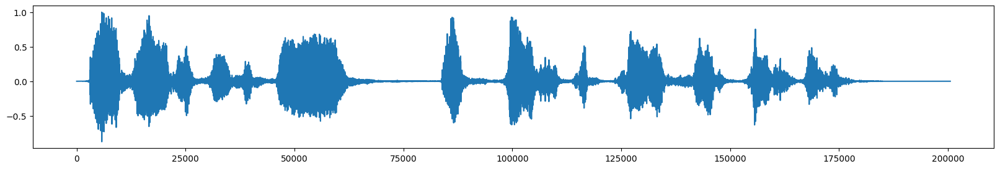

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)

### add noise

In [ ]:
noise_len = 2 # seconds
noise = band_limited_noise(min_freq=2000, max_freq = 12000, samples=len(data), samplerate=rate)*10
noise_clip = noise[:rate*noise_len]
audio_clip_band_limited = data+noise

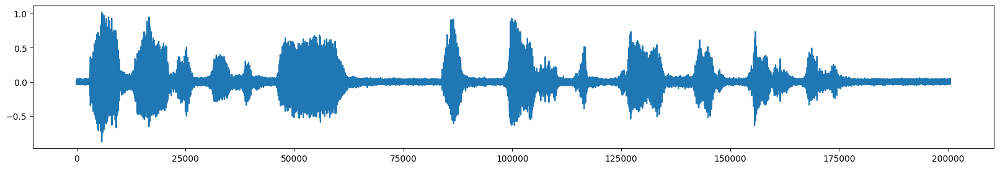

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_band_limited)

In [ ]:
IPython.display.Audio(data=audio_clip_band_limited, rate=rate)

### Stationary remove noise

In [ ]:
reduced_noise = nr.reduce_noise(y = audio_clip_band_limited, sr=rate, n_std_thresh_stationary=1.5,stationary=True)

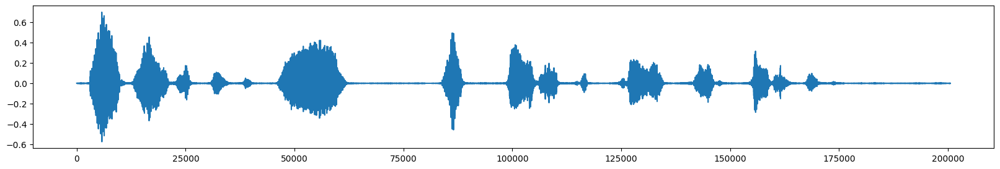

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)

In [ ]:
IPython.display.Audio(data=reduced_noise, rate=rate)

### Non-stationary noise reduction

In [ ]:
reduced_noise = nr.reduce_noise(y = audio_clip_band_limited, sr=rate, thresh_n_mult_nonstationary=2,stationary=False)

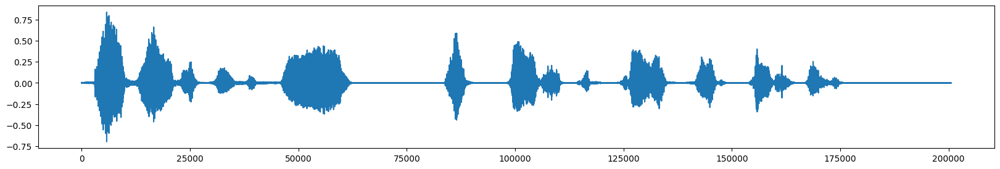

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)

In [ ]:
IPython.display.Audio(data=reduced_noise, rate=rate)

## A more difficult example

In [ ]:
url = "https://raw.githubusercontent.com/timsainb/noisereduce/master/assets/cafe_short.wav"
response = urllib.request.urlopen(url)
noise_data, noise_rate = sf.read(io.BytesIO(response.read()))

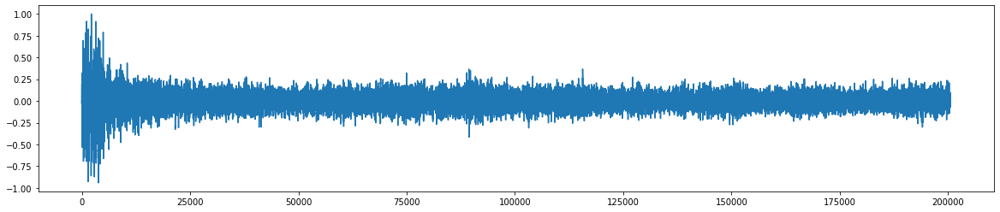

In [ ]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(noise_data)

In [ ]:
IPython.display.Audio(data=noise_data, rate=noise_rate)

### add noise to data

In [ ]:
snr = 2 # signal to noise ratio
noise_clip = noise_data/snr
audio_clip_cafe = data + noise_clip

### plot noisy data

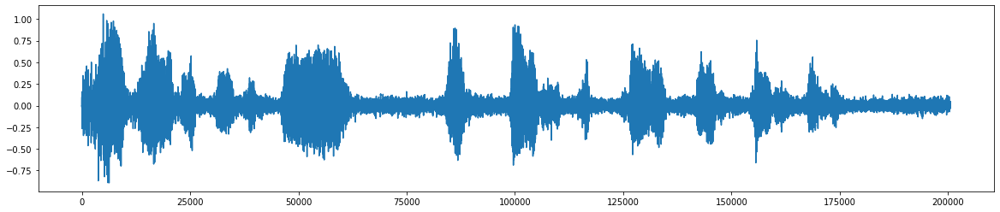

In [ ]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(audio_clip_cafe)
IPython.display.Audio(data=audio_clip_cafe, rate=noise_rate)

### Stationary remove noise

In [ ]:
reduced_noise = nr.reduce_noise(y = audio_clip_cafe, sr=rate, y_noise = noise_clip, n_std_thresh_stationary=1.5,stationary=True)

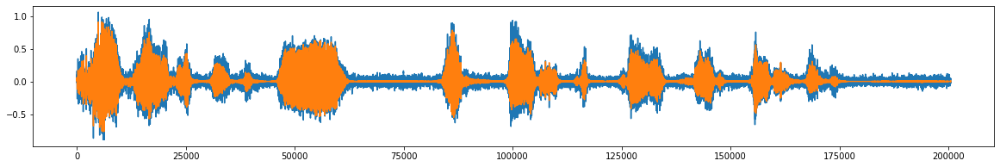

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_cafe)
ax.plot(reduced_noise)

In [ ]:
IPython.display.Audio(data=reduced_noise, rate=rate)

### Non-stationary noise reduction

In [ ]:
reduced_noise = nr.reduce_noise(y = audio_clip_cafe, sr=rate, thresh_n_mult_nonstationary=2,stationary=False)

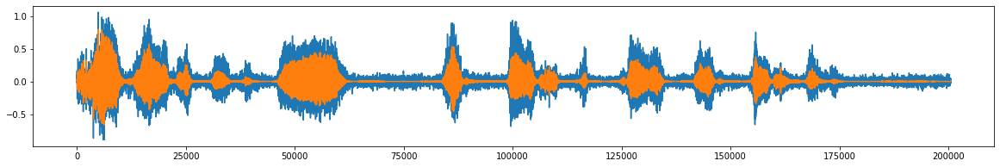

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(audio_clip_cafe)
ax.plot(reduced_noise, alpha = 1)
IPython.display.Audio(data=reduced_noise, rate=rate)

In [ ]:
IPython.display.Audio(data=reduced_noise, rate=rate)